In [1]:
%matplotlib inline

In [6]:
import functools

import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import torchvision
import random
import matplotlib.pyplot as plt
from torchvision import datasets, transforms
from torchsummary import summary
from torchvision.datasets import CIFAR10, CIFAR100

In [7]:
# Load encoder 

class SkipConnection(nn.Module):
    def __init__(self, outer_nc, inner_nc, input_nc=None,submodule=None, outermost=False, innermost=False, 
                 norm_layer=nn.BatchNorm2d, use_dropout=False, output_function=nn.Sigmoid):
        super(SkipConnection, self).__init__()
        self.outermost = outermost
        if type(norm_layer) == functools.partial:
            use_bias = norm_layer.func == nn.InstanceNorm2d
        else:
            use_bias = norm_layer == nn.InstanceNorm2d
        if input_nc is None:
            input_nc = outer_nc
        downconv = nn.Conv2d(input_nc, inner_nc, kernel_size=4,
                             stride=2, padding=1, bias=use_bias)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = norm_layer(inner_nc)
        uprelu = nn.ReLU(True)
        upnorm = norm_layer(outer_nc)

        if outermost:
            upconv = nn.ConvTranspose2d(inner_nc * 2, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1)
            down = [downconv]
            if output_function == nn.Tanh:
                up = [uprelu, upconv, nn.Tanh()]
            else:
                up = [uprelu, upconv, nn.Sigmoid()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(inner_nc, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1, bias=use_bias)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(inner_nc * 2, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1, bias=use_bias)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]

            if use_dropout:
                model = down + [submodule] + up + [nn.Dropout(0.5)]
            else:
                model = down + [submodule] + up

        self.model = nn.Sequential(*model)

    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

In [8]:
class Generator(nn.Module):
    def __init__(self, input_nc, output_nc, ngf=32,
                 norm_layer=nn.BatchNorm2d, use_dropout=False, output_function=nn.Sigmoid):
        super(Generator, self).__init__()
        # construct unet structure
        unet_block = SkipConnection(ngf * 8, ngf * 8, input_nc=None, submodule=None, norm_layer=norm_layer, innermost=True)
        unet_block = SkipConnection(ngf * 4, ngf * 8, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = SkipConnection(ngf * 2, ngf * 4, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = SkipConnection(ngf, ngf * 2, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = SkipConnection(output_nc, ngf, input_nc=input_nc, submodule=unet_block, outermost=True, norm_layer=norm_layer, output_function=output_function)

        self.model = unet_block

    def forward(self, input):
        return self.model(input)

In [9]:
device = torch.device('cuda:1')
# device = torch.device('cpu')

In [10]:
generator = Generator(input_nc=6, output_nc=3)
generator = generator.to(device)
generator.load_state_dict(torch.load('checkpoints/best_generator_loss.pth'))

<All keys matched successfully>

In [29]:
class Decoder(nn.Module):
    def __init__(self, nc=3, nhf=32):
        super(Decoder, self).__init__()
        # input is (3) x 32 x 32
        dropout = 0.3
        self.main = nn.Sequential(
            nn.Conv2d(nc, nhf, 3, 1, 1),
            nn.BatchNorm2d(nhf),
            nn.Dropout(dropout),
            nn.ReLU(True),
            nn.Conv2d(nhf, nhf * 2, 3, 1, 1),
            nn.BatchNorm2d(nhf*2),
            nn.Dropout(dropout),
            nn.ReLU(True),
            nn.Conv2d(nhf * 2, nhf * 4, 3, 1, 1),
            nn.BatchNorm2d(nhf*4),
            nn.Dropout(dropout),
            nn.ReLU(True),
            nn.Conv2d(nhf * 4, nhf * 2, 3, 1, 1),
            nn.BatchNorm2d(nhf*2),
            nn.Dropout(dropout),
            nn.ReLU(True),
            nn.Conv2d(nhf * 2, nhf, 3, 1, 1),
            nn.BatchNorm2d(nhf),
            nn.Dropout(dropout),
            nn.ReLU(True),
            nn.Conv2d(nhf, nc, 3, 1, 1),
            nn.Sigmoid()
        )

    def forward(self, input):
        output=self.main(input)
        return output

In [30]:
decoder = Decoder().to(device)

In [31]:
optimizerD = optim.Adam(decoder.parameters(), lr=1e-3, betas=(0.5, 0.999), weight_decay=1e-3)

In [14]:
def prepare_dataloader(
    num_workers=8, train_batch_size=128, eval_batch_size=256, dataset=CIFAR10
):

    train_transform = transforms.Compose(
        [
            transforms.RandomCrop(32, padding=4),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
        ]
    )

    test_transform = transforms.Compose(
        [
            transforms.ToTensor(),
        ]
    )

    train_set = dataset(
        root="data", train=True, download=True, transform=train_transform
    )

    test_set = dataset(
        root="data", train=False, download=True, transform=test_transform
    )

    train_sampler = torch.utils.data.RandomSampler(train_set)
    test_sampler = torch.utils.data.SequentialSampler(test_set)

    train_loader = torch.utils.data.DataLoader(
        dataset=train_set,
        batch_size=train_batch_size,
        sampler=train_sampler,
        num_workers=num_workers,
    )

    test_loader = torch.utils.data.DataLoader(
        dataset=test_set,
        batch_size=eval_batch_size,
        sampler=test_sampler,
        num_workers=num_workers,
    )

    return train_loader, test_loader

In [15]:
cifar100_train_loader, cifar100_test_loader = prepare_dataloader(dataset=CIFAR100)

Files already downloaded and verified
Files already downloaded and verified


In [16]:
cifar10_train_loader, cifar10_test_loader = prepare_dataloader(dataset=CIFAR10)

Files already downloaded and verified
Files already downloaded and verified


In [17]:
best_decoder_loss = 100

In [18]:
def show_images(images):
    grid_img = torchvision.utils.make_grid(images, nrow=3)
    plt.figure(figsize=(8, 6), dpi=80)
    plt.imshow(grid_img.permute(1,2,0))
    plt.show()

In [19]:
class AverageMeter(object):
    """
    Computes and stores the average and current value.
    """

    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [28]:
def test_decoder(test_loader, generator, decoder, mse_criterion, cuda=True, show=True, scale = 1):
    global best_decoder_loss
    generator.eval()
    decoder.eval()
 
    d_losses = AverageMeter()
    
    output_images = []
    
    with torch.no_grad():
        for i, (image, _) in enumerate(test_loader):
            # Select half dataset for container images
            pivot = len(image) 
            
            container_image = torch.zeros(image.shape)
            # container_image = torch.rand(image.shape)
            
            gen_input = torch.cat([container_image, image], dim=1)

            # To cuda
            if cuda:
                container_image = container_image.to(device)
                image = image.to(device)
                gen_input = gen_input.to(device)

            image_v = Variable(image)
            gen_input_v = Variable(gen_input)
            container_image_v = Variable(container_image)

            # Output of model 
            with torch.no_grad():
                privacy_image = generator(gen_input_v) * scale

                pred_image = decoder(privacy_image)
                pred_image = pred_image.to(device)
            
            # Calculate loss 
            d_loss = mse_criterion(pred_image, image_v)

            # Average loss 
            d_losses.update(d_loss.data, pivot)
            
        if show:
            for index in np.random.choice(pivot - 1, 4, replace = False):
                output_images.extend([image[index].cpu(), privacy_image[index].cpu(), pred_image[index].cpu()])
    
    print('Testing decoder - Epoch {} d_loss = {}'.format(epoch, d_losses.avg))      
    
    # Show some output images
    if show:
        show_images(output_images)
        
    # Save checkpoint 
    if d_losses.avg < best_decoder_loss:
        best_decoder_loss = d_losses.avg
        torch.save(decoder.state_dict(), 'checkpoints/best_decoder_loss.pth')
        print('Save best checkpoint with loss {}'.format(d_losses.avg))

In [22]:
# Training decoder 
import torch.nn.functional as F
def train_decoder(train_loader, epoch, generator, decoder, mse_criterion, cuda=True, show=True, scale = 1):
    generator.eval()
    decoder.train()

    d_losses = AverageMeter() 
    output_images = []

    for i, (image, _) in enumerate(train_loader):
        generator.zero_grad()
        decoder.zero_grad()
        
        # Select half dataset for container images
        pivot = len(image) 
        # container_image = image[0:pivot, :, :, :]
        # real_image = image[pivot:pivot*2, :, :, :]
        # real_label = label[pivot:pivot*2]
        container_image = torch.zeros(image.shape)
        # container_image = torch.rand(image.shape)

        # Create input of generator (6-dims: batch_size x 6 x 32 x 32)
        gen_input = torch.cat([container_image, image], dim=1)
        
        # To cuda
        if cuda:
            container_image = container_image.to(device)
            image = image.to(device)
            gen_input = gen_input.to(device)

        # Create variable
        image_v = Variable(image)
        gen_input_v = Variable(gen_input)
        container_image_v = Variable(container_image)

        # Output of model 
        with torch.no_grad():
            privacy_image = generator(gen_input_v) * scale

        pred_image = decoder(privacy_image)
        pred_image = pred_image.to(device)

        # Calculate loss 
        d_loss = mse_criterion(pred_image, image_v)
        
        # Average loss 
        d_losses.update(d_loss.data, pivot)
        
        if i % 100 == 0 and show:
            index = random.randint(0, pivot - 1)
            output_images.extend([image[index].cpu(), privacy_image[index].cpu(), pred_image[index].cpu()])
        
        # Backward
        d_loss.backward()

        optimizerD.step()
    
    print('Training decoder - Epoch {} d_loss = {}'.format(epoch, d_losses.avg))
    
    # Show some output images
    if show:
        show_images(output_images)

Training decoder - Epoch 0 d_loss = 0.5275548100471497


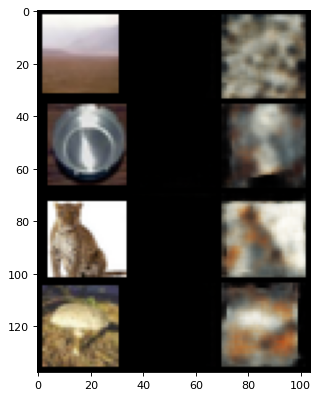

Testing on CIFAR100 test set
Testing decoder - Epoch 0 d_loss = 1.2508963346481323


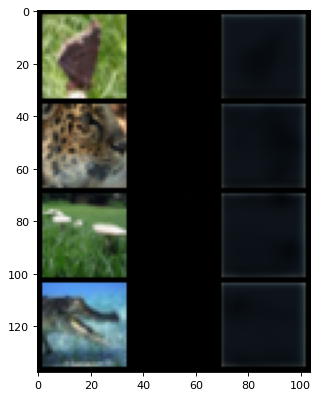

Testing on CIFAR10 train set
Testing decoder - Epoch 0 d_loss = 1.097471833229065


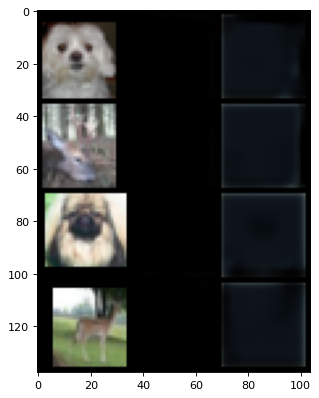

Testing on CIFAR10 test set
Testing decoder - Epoch 0 d_loss = 1.2435336112976074


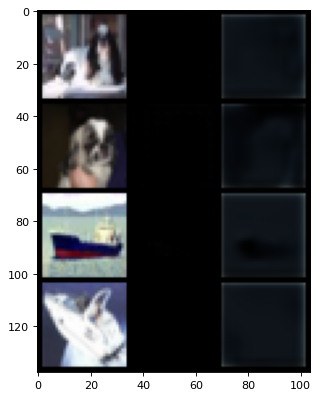

Training decoder - Epoch 1 d_loss = 0.511624276638031
Testing on CIFAR100 test set
Testing decoder - Epoch 1 d_loss = 2.208772897720337
Testing on CIFAR10 train set
Testing decoder - Epoch 1 d_loss = 2.1531388759613037
Testing on CIFAR10 test set
Testing decoder - Epoch 1 d_loss = 2.278212547302246
Training decoder - Epoch 2 d_loss = 0.5083291530609131
Testing on CIFAR100 test set
Testing decoder - Epoch 2 d_loss = 0.9817916750907898
Testing on CIFAR10 train set
Testing decoder - Epoch 2 d_loss = 0.8744886517524719
Testing on CIFAR10 test set
Testing decoder - Epoch 2 d_loss = 0.996184229850769
Training decoder - Epoch 3 d_loss = 0.5074687004089355
Testing on CIFAR100 test set
Testing decoder - Epoch 3 d_loss = 0.9597962498664856
Testing on CIFAR10 train set
Testing decoder - Epoch 3 d_loss = 0.7818829417228699
Testing on CIFAR10 test set
Testing decoder - Epoch 3 d_loss = 0.92930006980896
Training decoder - Epoch 4 d_loss = 0.5063965320587158
Testing on CIFAR100 test set
Testing decod

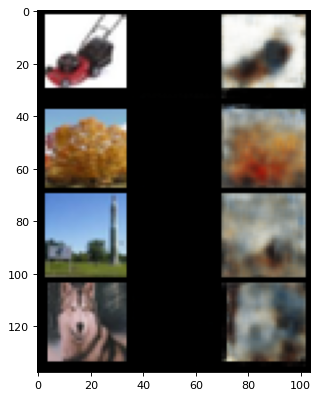

Testing on CIFAR100 test set
Testing decoder - Epoch 5 d_loss = 4.10629940032959


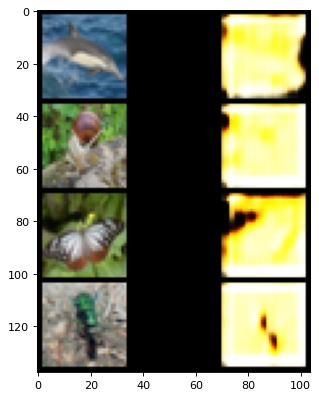

Testing on CIFAR10 train set
Testing decoder - Epoch 5 d_loss = 3.8045527935028076


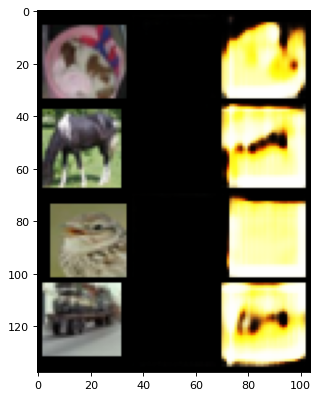

Testing on CIFAR10 test set
Testing decoder - Epoch 5 d_loss = 4.288936138153076


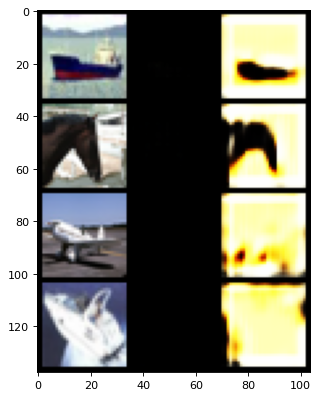

Training decoder - Epoch 6 d_loss = 0.5054131746292114
Testing on CIFAR100 test set
Testing decoder - Epoch 6 d_loss = 0.7473601698875427
Testing on CIFAR10 train set
Testing decoder - Epoch 6 d_loss = 0.7005745768547058
Testing on CIFAR10 test set
Testing decoder - Epoch 6 d_loss = 0.7581896185874939
Training decoder - Epoch 7 d_loss = 0.5050030946731567
Testing on CIFAR100 test set
Testing decoder - Epoch 7 d_loss = 0.7540178298950195
Testing on CIFAR10 train set
Testing decoder - Epoch 7 d_loss = 0.7580217719078064
Testing on CIFAR10 test set
Testing decoder - Epoch 7 d_loss = 0.7697322368621826
Training decoder - Epoch 8 d_loss = 0.5060586333274841
Testing on CIFAR100 test set
Testing decoder - Epoch 8 d_loss = 0.6724763512611389
Testing on CIFAR10 train set
Testing decoder - Epoch 8 d_loss = 0.6067882180213928
Testing on CIFAR10 test set
Testing decoder - Epoch 8 d_loss = 0.6754364371299744
Training decoder - Epoch 9 d_loss = 0.50450199842453
Testing on CIFAR100 test set
Testing d

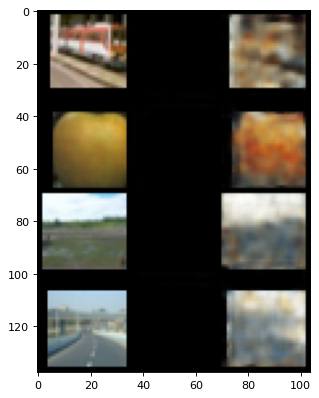

Testing on CIFAR100 test set
Testing decoder - Epoch 10 d_loss = 1.6324028968811035


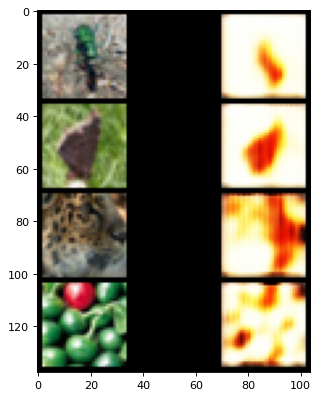

Testing on CIFAR10 train set
Testing decoder - Epoch 10 d_loss = 1.5566599369049072


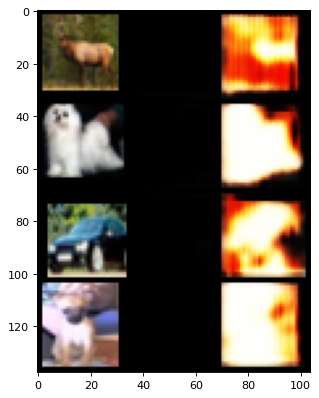

Testing on CIFAR10 test set
Testing decoder - Epoch 10 d_loss = 1.6948297023773193


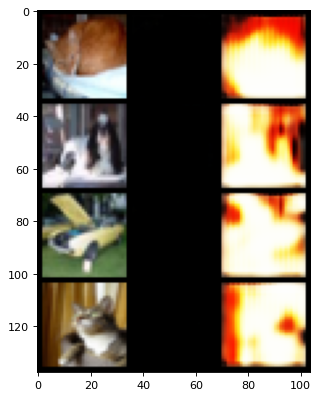

Training decoder - Epoch 11 d_loss = 0.5045469999313354
Testing on CIFAR100 test set
Testing decoder - Epoch 11 d_loss = 2.5070996284484863
Testing on CIFAR10 train set
Testing decoder - Epoch 11 d_loss = 2.12988018989563
Testing on CIFAR10 test set
Testing decoder - Epoch 11 d_loss = 2.474031686782837
Training decoder - Epoch 12 d_loss = 0.5043839812278748
Testing on CIFAR100 test set
Testing decoder - Epoch 12 d_loss = 0.928833544254303
Testing on CIFAR10 train set
Testing decoder - Epoch 12 d_loss = 0.8299398422241211
Testing on CIFAR10 test set
Testing decoder - Epoch 12 d_loss = 0.9188066124916077
Training decoder - Epoch 13 d_loss = 0.5043455958366394
Testing on CIFAR100 test set
Testing decoder - Epoch 13 d_loss = 3.242316246032715
Testing on CIFAR10 train set
Testing decoder - Epoch 13 d_loss = 3.12726092338562
Testing on CIFAR10 test set
Testing decoder - Epoch 13 d_loss = 3.3802523612976074
Training decoder - Epoch 14 d_loss = 0.5035623908042908
Testing on CIFAR100 test set
T

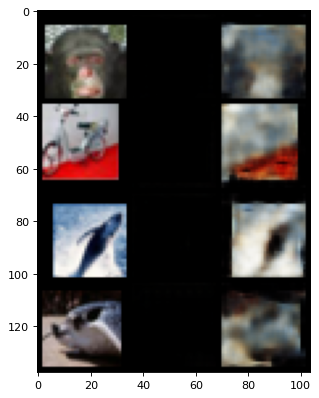

Testing on CIFAR100 test set
Testing decoder - Epoch 15 d_loss = 0.8305954933166504


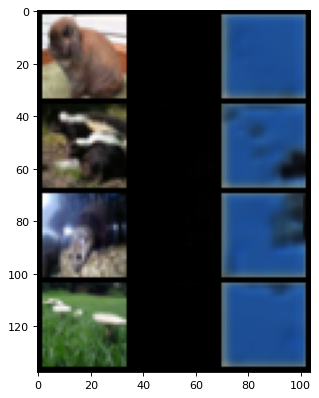

Testing on CIFAR10 train set
Testing decoder - Epoch 15 d_loss = 0.756889283657074


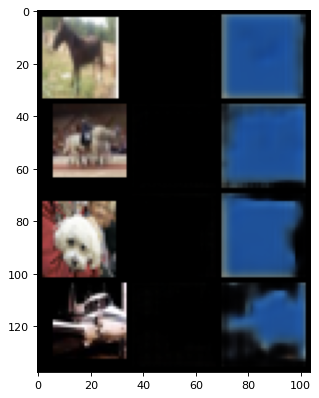

Testing on CIFAR10 test set
Testing decoder - Epoch 15 d_loss = 0.8232414722442627


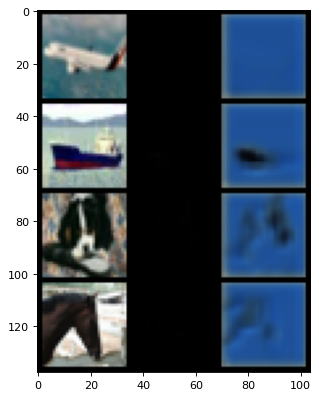

Training decoder - Epoch 16 d_loss = 0.5038828253746033
Testing on CIFAR100 test set
Testing decoder - Epoch 16 d_loss = 2.9233779907226562
Testing on CIFAR10 train set
Testing decoder - Epoch 16 d_loss = 2.446113348007202
Testing on CIFAR10 test set
Testing decoder - Epoch 16 d_loss = 2.895676374435425
Training decoder - Epoch 17 d_loss = 0.5036777257919312
Testing on CIFAR100 test set
Testing decoder - Epoch 17 d_loss = 4.112741470336914
Testing on CIFAR10 train set
Testing decoder - Epoch 17 d_loss = 4.039880275726318
Testing on CIFAR10 test set
Testing decoder - Epoch 17 d_loss = 4.296746730804443
Training decoder - Epoch 18 d_loss = 0.510794460773468
Testing on CIFAR100 test set
Testing decoder - Epoch 18 d_loss = 0.6274126768112183
Testing on CIFAR10 train set
Testing decoder - Epoch 18 d_loss = 0.5758411288261414
Testing on CIFAR10 test set
Testing decoder - Epoch 18 d_loss = 0.6347054243087769
Training decoder - Epoch 19 d_loss = 0.5182713866233826
Testing on CIFAR100 test set


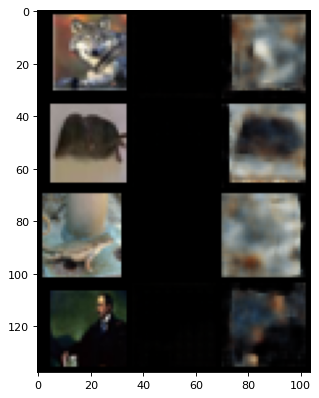

Testing on CIFAR100 test set
Testing decoder - Epoch 20 d_loss = 49.57069396972656


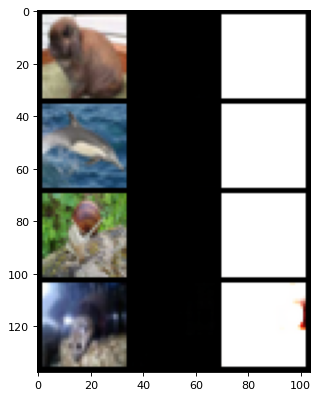

Testing on CIFAR10 train set
Testing decoder - Epoch 20 d_loss = 53.619388580322266


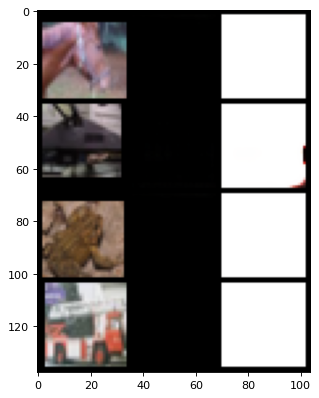

Testing on CIFAR10 test set
Testing decoder - Epoch 20 d_loss = 50.401466369628906


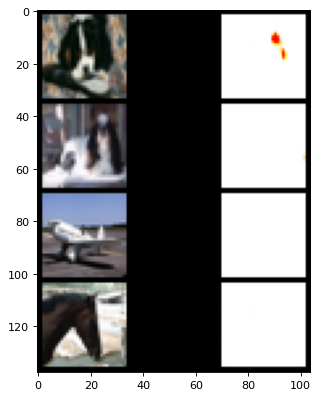

Training decoder - Epoch 21 d_loss = 0.5059479475021362
Testing on CIFAR100 test set
Testing decoder - Epoch 21 d_loss = 1.7305443286895752
Testing on CIFAR10 train set
Testing decoder - Epoch 21 d_loss = 1.5289826393127441
Testing on CIFAR10 test set
Testing decoder - Epoch 21 d_loss = 1.7295984029769897
Training decoder - Epoch 22 d_loss = 0.5048640370368958
Testing on CIFAR100 test set
Testing decoder - Epoch 22 d_loss = 0.8068488240242004
Testing on CIFAR10 train set
Testing decoder - Epoch 22 d_loss = 0.6972173452377319
Testing on CIFAR10 test set
Testing decoder - Epoch 22 d_loss = 0.8096161484718323
Training decoder - Epoch 23 d_loss = 0.5048566460609436
Testing on CIFAR100 test set
Testing decoder - Epoch 23 d_loss = 1.0456336736679077
Testing on CIFAR10 train set
Testing decoder - Epoch 23 d_loss = 0.9076200723648071
Testing on CIFAR10 test set
Testing decoder - Epoch 23 d_loss = 1.045506477355957
Training decoder - Epoch 24 d_loss = 0.5040670037269592
Testing on CIFAR100 test

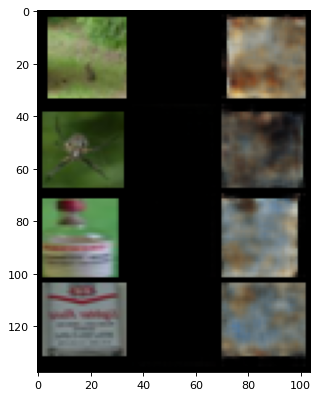

Testing on CIFAR100 test set
Testing decoder - Epoch 25 d_loss = 39.97119140625


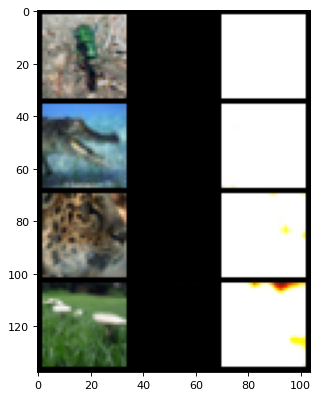

Testing on CIFAR10 train set
Testing decoder - Epoch 25 d_loss = 40.61741638183594


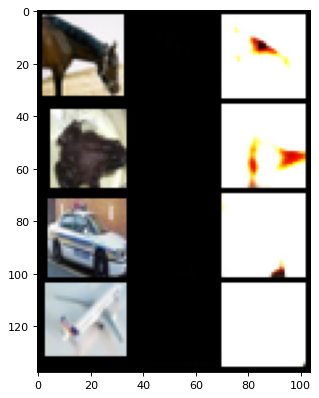

Testing on CIFAR10 test set
Testing decoder - Epoch 25 d_loss = 41.316192626953125


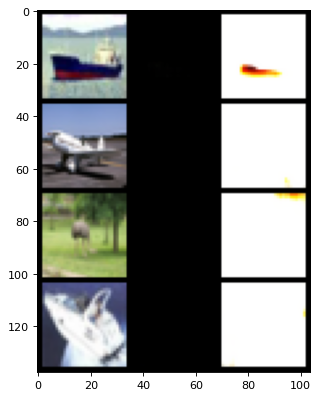

Training decoder - Epoch 26 d_loss = 0.5252833962440491
Testing on CIFAR100 test set
Testing decoder - Epoch 26 d_loss = 8.093453407287598
Testing on CIFAR10 train set
Testing decoder - Epoch 26 d_loss = 7.71853494644165
Testing on CIFAR10 test set
Testing decoder - Epoch 26 d_loss = 8.182112693786621
Training decoder - Epoch 27 d_loss = 0.5148626565933228
Testing on CIFAR100 test set
Testing decoder - Epoch 27 d_loss = 1.462699294090271
Testing on CIFAR10 train set
Testing decoder - Epoch 27 d_loss = 1.4093674421310425
Testing on CIFAR10 test set
Testing decoder - Epoch 27 d_loss = 1.4994231462478638
Training decoder - Epoch 28 d_loss = 0.508516252040863
Testing on CIFAR100 test set
Testing decoder - Epoch 28 d_loss = 50.55228805541992
Testing on CIFAR10 train set
Testing decoder - Epoch 28 d_loss = 56.4427604675293
Testing on CIFAR10 test set
Testing decoder - Epoch 28 d_loss = 51.22294616699219
Training decoder - Epoch 29 d_loss = 0.5059024691581726
Testing on CIFAR100 test set
Test

In [34]:
# Training decoder first
mse_criterion = F.binary_cross_entropy
scale = 1.
for epoch in range(30):
    show = False
    if epoch % 5 == 0:
        show = True
    # Training in domain
    train_decoder(cifar100_train_loader, epoch, generator, decoder, mse_criterion, show=show, scale = scale)
    # Testing in domain
    print('Testing on CIFAR100 test set')
    test_decoder(cifar100_test_loader, generator, decoder, mse_criterion, show=show, scale = scale)
    # Testing in out of domain dataset
    print('Testing on CIFAR10 train set')
    test_decoder(cifar10_train_loader, generator, decoder, mse_criterion, show=show, scale = scale)
    print('Testing on CIFAR10 test set')
    test_decoder(cifar10_test_loader, generator, decoder, mse_criterion, show=show, scale = scale)

Training decoder - Epoch 0 d_loss = 0.5193917155265808


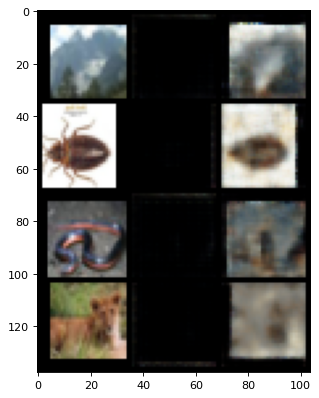

Testing on CIFAR100 test set
Testing decoder - Epoch 0 d_loss = 0.5792478322982788


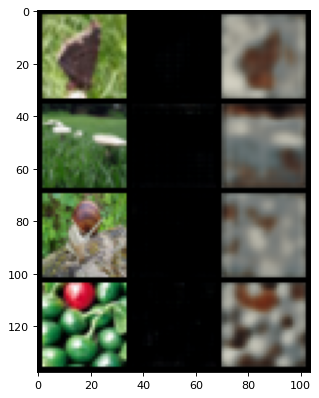

Testing on CIFAR10 train set
Testing decoder - Epoch 0 d_loss = 0.5340055227279663


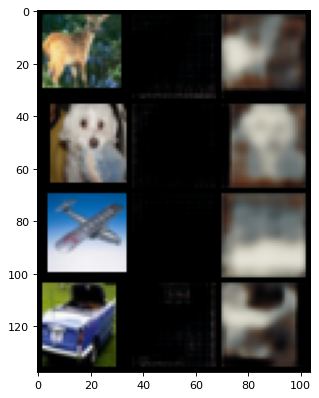

Testing on CIFAR10 test set
Testing decoder - Epoch 0 d_loss = 0.5925724506378174


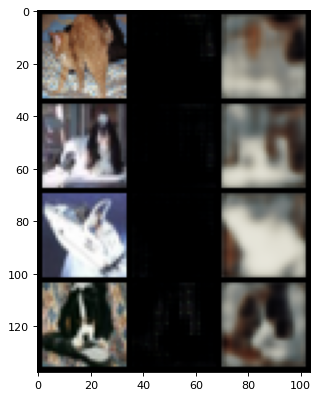

Training decoder - Epoch 1 d_loss = 0.5152590274810791
Testing on CIFAR100 test set
Testing decoder - Epoch 1 d_loss = 0.5640386343002319
Testing on CIFAR10 train set
Testing decoder - Epoch 1 d_loss = 0.5105514526367188
Save best checkpoint with loss 0.5105514526367188
Testing on CIFAR10 test set
Testing decoder - Epoch 1 d_loss = 0.5818679332733154
Training decoder - Epoch 2 d_loss = 0.5079025626182556
Testing on CIFAR100 test set
Testing decoder - Epoch 2 d_loss = 0.560697615146637
Testing on CIFAR10 train set
Testing decoder - Epoch 2 d_loss = 0.508253276348114
Save best checkpoint with loss 0.508253276348114
Testing on CIFAR10 test set
Testing decoder - Epoch 2 d_loss = 0.579200267791748
Training decoder - Epoch 3 d_loss = 0.4996023178100586
Testing on CIFAR100 test set
Testing decoder - Epoch 3 d_loss = 0.5668660402297974
Testing on CIFAR10 train set
Testing decoder - Epoch 3 d_loss = 0.512474536895752
Testing on CIFAR10 test set
Testing decoder - Epoch 3 d_loss = 0.5844374895095

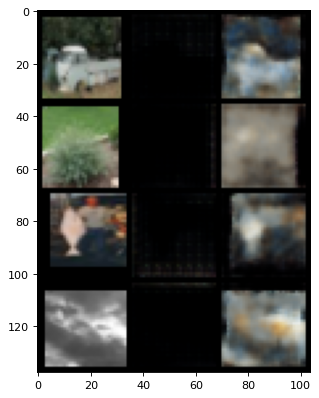

Testing on CIFAR100 test set
Testing decoder - Epoch 5 d_loss = 0.5636039972305298


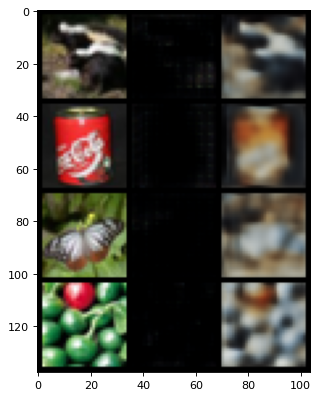

Testing on CIFAR10 train set
Testing decoder - Epoch 5 d_loss = 0.5103172063827515


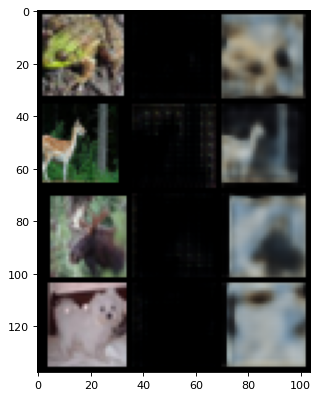

Testing on CIFAR10 test set
Testing decoder - Epoch 5 d_loss = 0.5814684629440308


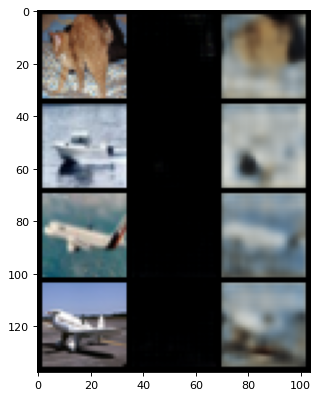

Training decoder - Epoch 6 d_loss = 0.5064776539802551
Testing on CIFAR100 test set
Testing decoder - Epoch 6 d_loss = 0.7937471270561218
Testing on CIFAR10 train set
Testing decoder - Epoch 6 d_loss = 0.7318646907806396
Testing on CIFAR10 test set
Testing decoder - Epoch 6 d_loss = 0.8136225938796997
Training decoder - Epoch 7 d_loss = 0.5169515609741211
Testing on CIFAR100 test set
Testing decoder - Epoch 7 d_loss = 0.5950535535812378
Testing on CIFAR10 train set
Testing decoder - Epoch 7 d_loss = 0.5334637761116028
Testing on CIFAR10 test set
Testing decoder - Epoch 7 d_loss = 0.6036779880523682
Training decoder - Epoch 8 d_loss = 0.5021458268165588
Testing on CIFAR100 test set
Testing decoder - Epoch 8 d_loss = 0.5838714241981506
Testing on CIFAR10 train set
Testing decoder - Epoch 8 d_loss = 0.5251529812812805
Testing on CIFAR10 test set
Testing decoder - Epoch 8 d_loss = 0.6031952500343323
Training decoder - Epoch 9 d_loss = 0.49880358576774597
Testing on CIFAR100 test set
Testin

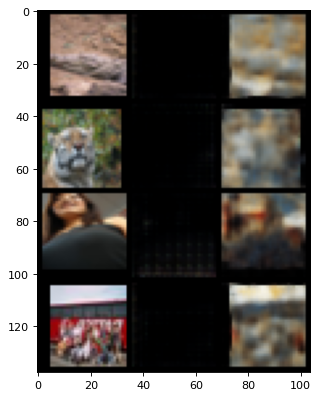

Testing on CIFAR100 test set
Testing decoder - Epoch 10 d_loss = 0.5687955021858215


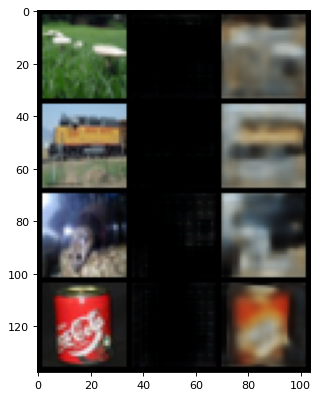

Testing on CIFAR10 train set
Testing decoder - Epoch 10 d_loss = 0.5103600025177002


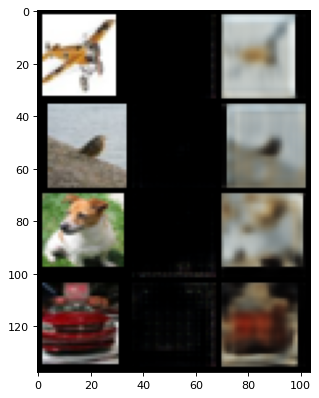

Testing on CIFAR10 test set
Testing decoder - Epoch 10 d_loss = 0.5839982032775879


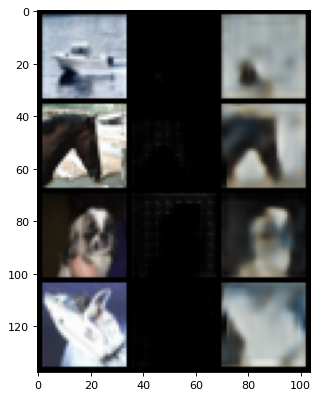

Training decoder - Epoch 11 d_loss = 0.49867144227027893
Testing on CIFAR100 test set
Testing decoder - Epoch 11 d_loss = 0.5646237730979919
Testing on CIFAR10 train set
Testing decoder - Epoch 11 d_loss = 0.5102259516716003
Testing on CIFAR10 test set
Testing decoder - Epoch 11 d_loss = 0.5816146731376648
Training decoder - Epoch 12 d_loss = 0.4971029460430145
Testing on CIFAR100 test set
Testing decoder - Epoch 12 d_loss = 0.5700501799583435
Testing on CIFAR10 train set
Testing decoder - Epoch 12 d_loss = 0.5147085189819336
Testing on CIFAR10 test set
Testing decoder - Epoch 12 d_loss = 0.5883424878120422
Training decoder - Epoch 13 d_loss = 0.5011261105537415
Testing on CIFAR100 test set
Testing decoder - Epoch 13 d_loss = 0.5883057713508606
Testing on CIFAR10 train set
Testing decoder - Epoch 13 d_loss = 0.5302774310112
Testing on CIFAR10 test set
Testing decoder - Epoch 13 d_loss = 0.6044236421585083
Training decoder - Epoch 14 d_loss = 0.49904298782348633
Testing on CIFAR100 test

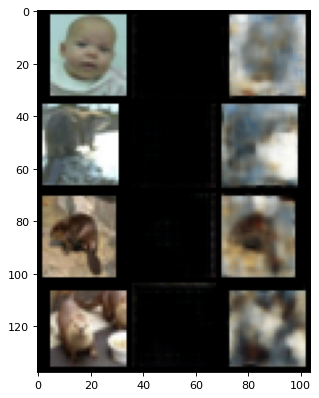

Testing on CIFAR100 test set
Testing decoder - Epoch 15 d_loss = 0.5904834866523743


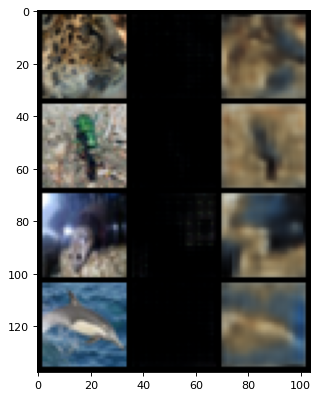

Testing on CIFAR10 train set
Testing decoder - Epoch 15 d_loss = 0.5286319851875305


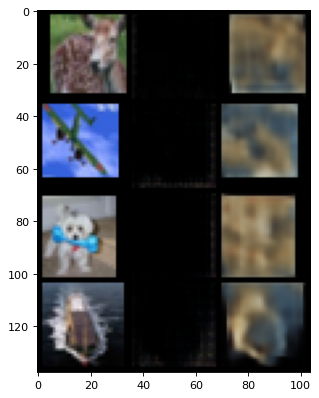

Testing on CIFAR10 test set
Testing decoder - Epoch 15 d_loss = 0.6071621179580688


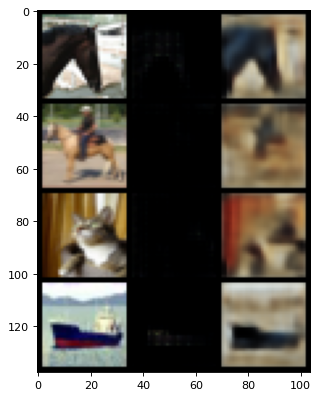

Training decoder - Epoch 16 d_loss = 0.49700549244880676
Testing on CIFAR100 test set
Testing decoder - Epoch 16 d_loss = 0.5724062919616699
Testing on CIFAR10 train set
Testing decoder - Epoch 16 d_loss = 0.5158998370170593
Testing on CIFAR10 test set
Testing decoder - Epoch 16 d_loss = 0.5884872674942017
Training decoder - Epoch 17 d_loss = 0.4969358742237091
Testing on CIFAR100 test set
Testing decoder - Epoch 17 d_loss = 0.6279762983322144
Testing on CIFAR10 train set
Testing decoder - Epoch 17 d_loss = 0.5605654716491699
Testing on CIFAR10 test set
Testing decoder - Epoch 17 d_loss = 0.6520205140113831
Training decoder - Epoch 18 d_loss = 0.5102449655532837
Testing on CIFAR100 test set
Testing decoder - Epoch 18 d_loss = 0.6060294508934021
Testing on CIFAR10 train set
Testing decoder - Epoch 18 d_loss = 0.5539350509643555
Testing on CIFAR10 test set
Testing decoder - Epoch 18 d_loss = 0.614632248878479
Training decoder - Epoch 19 d_loss = 0.515336811542511
Testing on CIFAR100 test

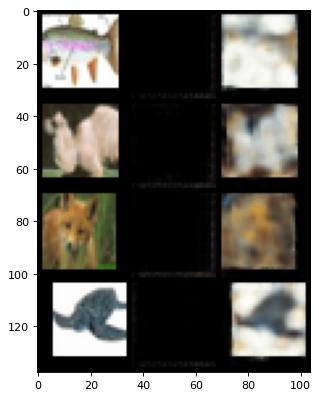

Testing on CIFAR100 test set
Testing decoder - Epoch 20 d_loss = 0.5853652954101562


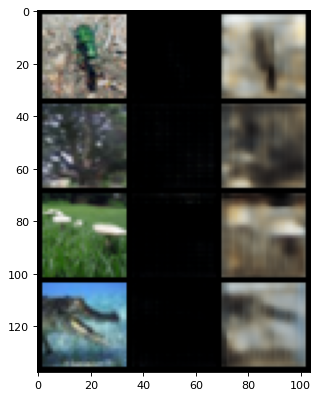

Testing on CIFAR10 train set
Testing decoder - Epoch 20 d_loss = 0.5256198048591614


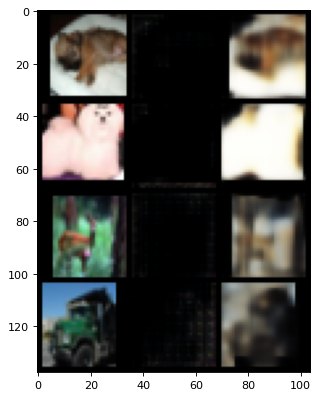

Testing on CIFAR10 test set
Testing decoder - Epoch 20 d_loss = 0.6005703210830688


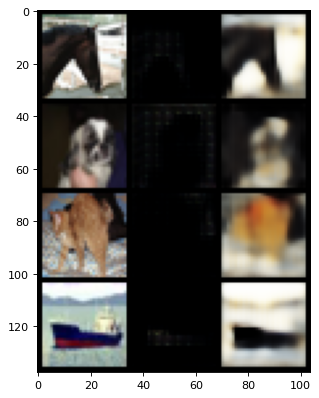

Training decoder - Epoch 21 d_loss = 0.49946752190589905
Testing on CIFAR100 test set
Testing decoder - Epoch 21 d_loss = 0.564174473285675
Testing on CIFAR10 train set
Testing decoder - Epoch 21 d_loss = 0.5082387924194336
Testing on CIFAR10 test set
Testing decoder - Epoch 21 d_loss = 0.5810711979866028
Training decoder - Epoch 22 d_loss = 0.49844253063201904
Testing on CIFAR100 test set
Testing decoder - Epoch 22 d_loss = 0.568378210067749
Testing on CIFAR10 train set
Testing decoder - Epoch 22 d_loss = 0.5117500424385071
Testing on CIFAR10 test set
Testing decoder - Epoch 22 d_loss = 0.5831780433654785
Training decoder - Epoch 23 d_loss = 0.4978410005569458
Testing on CIFAR100 test set
Testing decoder - Epoch 23 d_loss = 0.5762417912483215
Testing on CIFAR10 train set
Testing decoder - Epoch 23 d_loss = 0.5168991088867188
Testing on CIFAR10 test set
Testing decoder - Epoch 23 d_loss = 0.5932840704917908
Training decoder - Epoch 24 d_loss = 0.4978574812412262
Testing on CIFAR100 tes

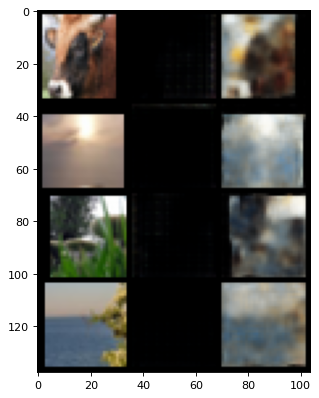

Testing on CIFAR100 test set
Testing decoder - Epoch 25 d_loss = 0.5735451579093933


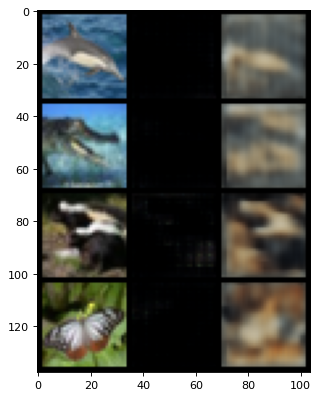

Testing on CIFAR10 train set
Testing decoder - Epoch 25 d_loss = 0.5239907503128052


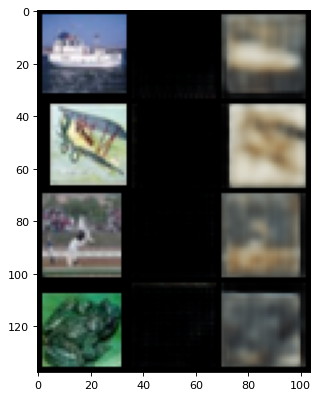

Testing on CIFAR10 test set
Testing decoder - Epoch 25 d_loss = 0.5903258323669434


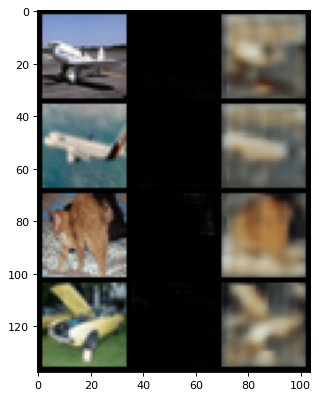

Training decoder - Epoch 26 d_loss = 0.5032027363777161
Testing on CIFAR100 test set
Testing decoder - Epoch 26 d_loss = 0.6075865626335144
Testing on CIFAR10 train set
Testing decoder - Epoch 26 d_loss = 0.5399299263954163
Testing on CIFAR10 test set
Testing decoder - Epoch 26 d_loss = 0.6244938969612122
Training decoder - Epoch 27 d_loss = 0.49829065799713135
Testing on CIFAR100 test set
Testing decoder - Epoch 27 d_loss = 0.5709026455879211
Testing on CIFAR10 train set
Testing decoder - Epoch 27 d_loss = 0.5111566781997681
Testing on CIFAR10 test set
Testing decoder - Epoch 27 d_loss = 0.5864309072494507
Training decoder - Epoch 28 d_loss = 0.5020428895950317
Testing on CIFAR100 test set
Testing decoder - Epoch 28 d_loss = 0.5912102460861206
Testing on CIFAR10 train set
Testing decoder - Epoch 28 d_loss = 0.5462749600410461
Testing on CIFAR10 test set
Testing decoder - Epoch 28 d_loss = 0.605132520198822
Training decoder - Epoch 29 d_loss = 0.504206657409668
Testing on CIFAR100 test

In [33]:
# Training decoder first
mse_criterion = F.binary_cross_entropy
scale = 10.
for epoch in range(30):
    show = False
    if epoch % 5 == 0:
        show = True
    # Training in domain
    train_decoder(cifar100_train_loader, epoch, generator, decoder, mse_criterion, show=show, scale = scale)
    # Testing in domain
    print('Testing on CIFAR100 test set')
    test_decoder(cifar100_test_loader, generator, decoder, mse_criterion, show=show, scale = scale)
    # Testing in out of domain dataset
    print('Testing on CIFAR10 train set')
    test_decoder(cifar10_train_loader, generator, decoder, mse_criterion, show=show, scale = scale)
    print('Testing on CIFAR10 test set')
    test_decoder(cifar10_test_loader, generator, decoder, mse_criterion, show=show, scale = scale)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Training decoder - Epoch 0 d_loss = 0.5057859420776367


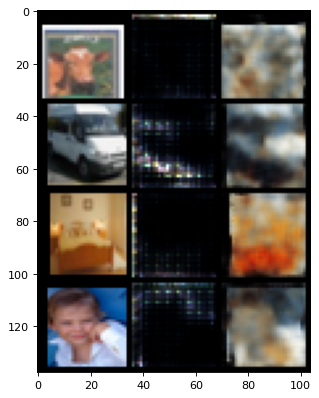

Testing on CIFAR100 test set
Testing decoder - Epoch 0 d_loss = 0.5706941485404968


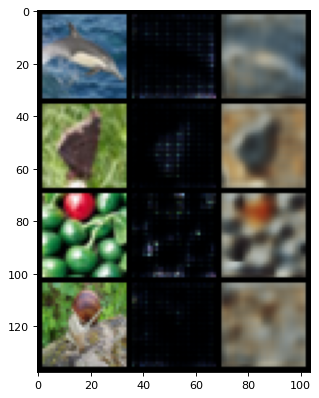

Testing on CIFAR10 train set


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Testing decoder - Epoch 0 d_loss = 0.5156993269920349


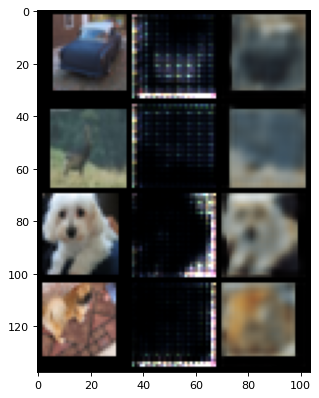

Testing on CIFAR10 test set


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Testing decoder - Epoch 0 d_loss = 0.5892235636711121


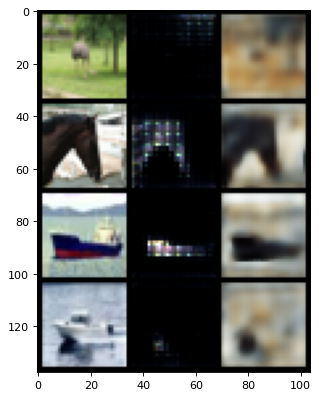

Training decoder - Epoch 1 d_loss = 0.5206577181816101
Testing on CIFAR100 test set
Testing decoder - Epoch 1 d_loss = 0.5850079655647278
Testing on CIFAR10 train set
Testing decoder - Epoch 1 d_loss = 0.5304011702537537
Testing on CIFAR10 test set
Testing decoder - Epoch 1 d_loss = 0.5989637970924377
Training decoder - Epoch 2 d_loss = 0.5096443891525269
Testing on CIFAR100 test set
Testing decoder - Epoch 2 d_loss = 0.5727002024650574
Testing on CIFAR10 train set
Testing decoder - Epoch 2 d_loss = 0.5172927379608154
Testing on CIFAR10 test set
Testing decoder - Epoch 2 d_loss = 0.5885796546936035
Training decoder - Epoch 3 d_loss = 0.5049805045127869
Testing on CIFAR100 test set
Testing decoder - Epoch 3 d_loss = 0.5693967342376709
Testing on CIFAR10 train set
Testing decoder - Epoch 3 d_loss = 0.5144016146659851
Testing on CIFAR10 test set
Testing decoder - Epoch 3 d_loss = 0.5880432724952698
Training decoder - Epoch 4 d_loss = 0.5038116574287415
Testing on CIFAR100 test set
Testing

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Training decoder - Epoch 5 d_loss = 0.5031028389930725


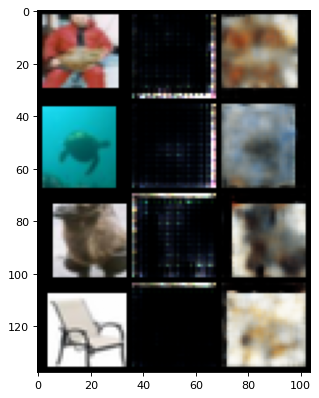

Testing on CIFAR100 test set
Testing decoder - Epoch 5 d_loss = 0.5713366866111755


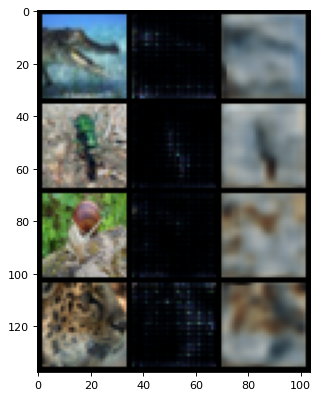

Testing on CIFAR10 train set


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Testing decoder - Epoch 5 d_loss = 0.5148064494132996


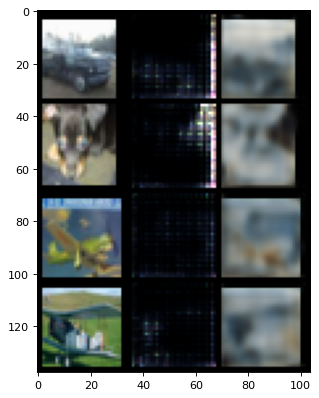

Testing on CIFAR10 test set


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Testing decoder - Epoch 5 d_loss = 0.587687075138092


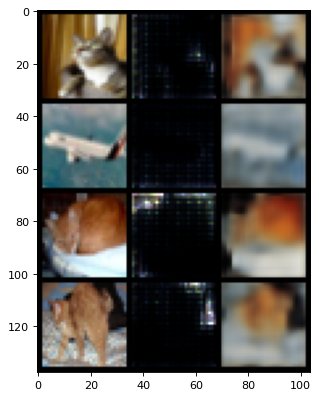

Training decoder - Epoch 6 d_loss = 0.5019791126251221
Testing on CIFAR100 test set
Testing decoder - Epoch 6 d_loss = 0.565808117389679
Testing on CIFAR10 train set
Testing decoder - Epoch 6 d_loss = 0.5108222365379333
Testing on CIFAR10 test set
Testing decoder - Epoch 6 d_loss = 0.5834313631057739
Training decoder - Epoch 7 d_loss = 0.503000795841217
Testing on CIFAR100 test set
Testing decoder - Epoch 7 d_loss = 0.5667147636413574
Testing on CIFAR10 train set
Testing decoder - Epoch 7 d_loss = 0.5103760957717896
Testing on CIFAR10 test set
Testing decoder - Epoch 7 d_loss = 0.5838326215744019
Training decoder - Epoch 8 d_loss = 0.5019831657409668
Testing on CIFAR100 test set
Testing decoder - Epoch 8 d_loss = 0.5636579394340515
Testing on CIFAR10 train set
Testing decoder - Epoch 8 d_loss = 0.5080192685127258
Testing on CIFAR10 test set
Testing decoder - Epoch 8 d_loss = 0.580966055393219
Training decoder - Epoch 9 d_loss = 0.50397127866745
Testing on CIFAR100 test set
Testing deco

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Training decoder - Epoch 10 d_loss = 0.5060348510742188


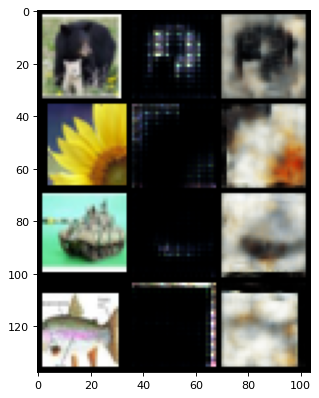

Testing on CIFAR100 test set
Testing decoder - Epoch 10 d_loss = 0.5657187104225159


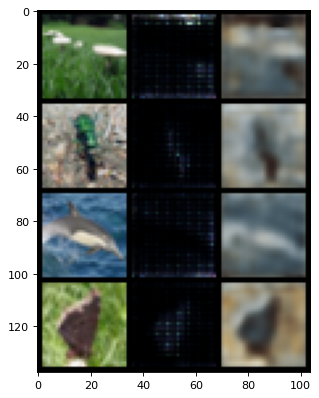

Testing on CIFAR10 train set


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Testing decoder - Epoch 10 d_loss = 0.5104663968086243


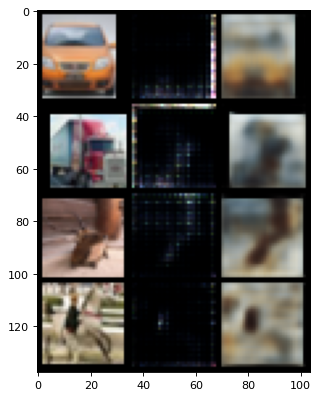

Testing on CIFAR10 test set


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Testing decoder - Epoch 10 d_loss = 0.5826855897903442


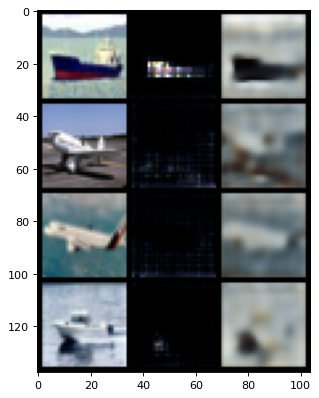

Training decoder - Epoch 11 d_loss = 0.5023750066757202
Testing on CIFAR100 test set
Testing decoder - Epoch 11 d_loss = 0.5801262259483337
Testing on CIFAR10 train set
Testing decoder - Epoch 11 d_loss = 0.520450234413147
Testing on CIFAR10 test set
Testing decoder - Epoch 11 d_loss = 0.595197319984436
Training decoder - Epoch 12 d_loss = 0.5033383965492249
Testing on CIFAR100 test set
Testing decoder - Epoch 12 d_loss = 0.561773955821991
Testing on CIFAR10 train set
Testing decoder - Epoch 12 d_loss = 0.5096577405929565
Testing on CIFAR10 test set
Testing decoder - Epoch 12 d_loss = 0.5801570415496826
Training decoder - Epoch 13 d_loss = 0.5019133687019348
Testing on CIFAR100 test set
Testing decoder - Epoch 13 d_loss = 0.5839071273803711
Testing on CIFAR10 train set
Testing decoder - Epoch 13 d_loss = 0.5223278999328613
Testing on CIFAR10 test set
Testing decoder - Epoch 13 d_loss = 0.5976341366767883
Training decoder - Epoch 14 d_loss = 0.5020501613616943
Testing on CIFAR100 test s

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Training decoder - Epoch 15 d_loss = 0.501808762550354


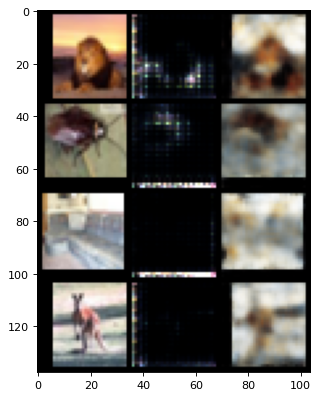

Testing on CIFAR100 test set


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Testing decoder - Epoch 15 d_loss = 0.5806974768638611


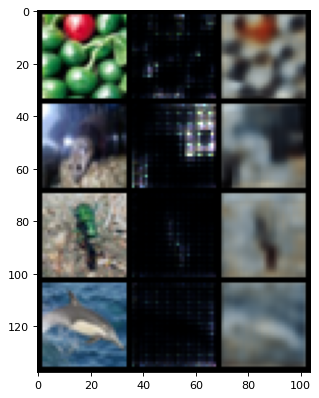

Testing on CIFAR10 train set


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Testing decoder - Epoch 15 d_loss = 0.5188431143760681


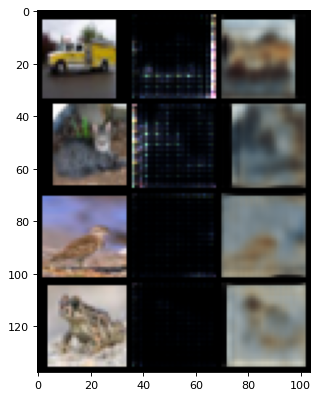

Testing on CIFAR10 test set
Testing decoder - Epoch 15 d_loss = 0.5945935249328613


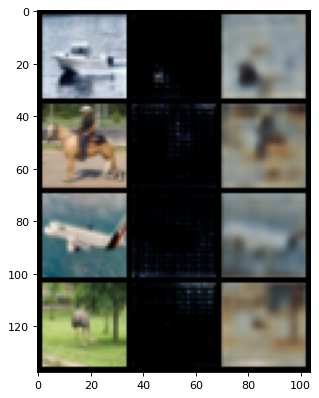

Training decoder - Epoch 16 d_loss = 0.5013818740844727
Testing on CIFAR100 test set
Testing decoder - Epoch 16 d_loss = 0.5709234476089478
Testing on CIFAR10 train set
Testing decoder - Epoch 16 d_loss = 0.5125542283058167
Testing on CIFAR10 test set
Testing decoder - Epoch 16 d_loss = 0.5857897996902466
Training decoder - Epoch 17 d_loss = 0.5015406608581543
Testing on CIFAR100 test set
Testing decoder - Epoch 17 d_loss = 0.5738831758499146
Testing on CIFAR10 train set
Testing decoder - Epoch 17 d_loss = 0.5132419466972351
Testing on CIFAR10 test set
Testing decoder - Epoch 17 d_loss = 0.5879455804824829
Training decoder - Epoch 18 d_loss = 0.5019515156745911
Testing on CIFAR100 test set
Testing decoder - Epoch 18 d_loss = 0.5762397646903992
Testing on CIFAR10 train set
Testing decoder - Epoch 18 d_loss = 0.5164679288864136
Testing on CIFAR10 test set
Testing decoder - Epoch 18 d_loss = 0.5913183093070984
Training decoder - Epoch 19 d_loss = 0.5008662939071655
Testing on CIFAR100 tes

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Training decoder - Epoch 20 d_loss = 0.5015084743499756


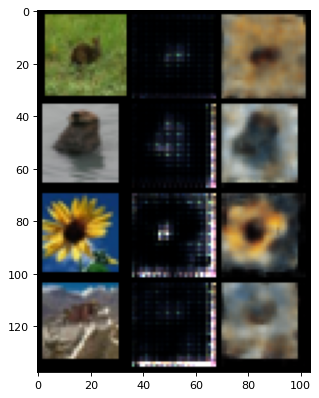

Testing on CIFAR100 test set


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Testing decoder - Epoch 20 d_loss = 0.5692977905273438


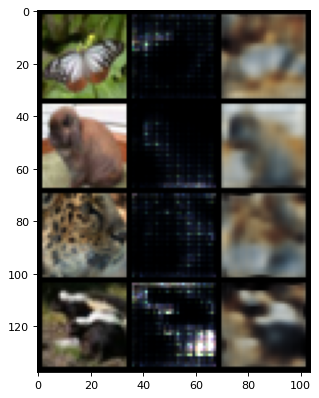

Testing on CIFAR10 train set


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Testing decoder - Epoch 20 d_loss = 0.5118462443351746


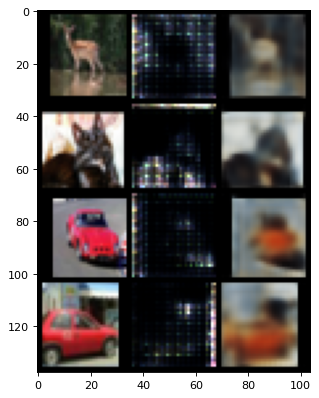

Testing on CIFAR10 test set


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Testing decoder - Epoch 20 d_loss = 0.586222231388092


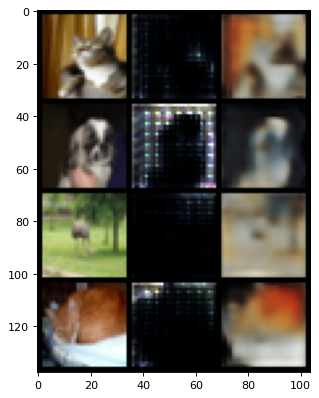

KeyboardInterrupt: 

In [35]:
# Training decoder first
scale = 100.
for epoch in range(30):
    show = False
    if epoch % 5 == 0:
        show = True
    # Training in domain
    train_decoder(cifar100_train_loader, epoch, generator, decoder, mse_criterion, show=show, scale = scale)
    # Testing in domain
    print('Testing on CIFAR100 test set')
    test_decoder(cifar100_test_loader, generator, decoder, mse_criterion, show=show, scale = scale)
    # Testing in out of domain dataset
    print('Testing on CIFAR10 train set')
    test_decoder(cifar10_train_loader, generator, decoder, mse_criterion, show=show, scale = scale)
    print('Testing on CIFAR10 test set')
    test_decoder(cifar10_test_loader, generator, decoder, mse_criterion, show=show, scale = scale)

In [36]:
decoder = Decoder().to(device)
optimizerD = optim.Adam(decoder.parameters(), lr=1e-3, betas=(0.5, 0.999), weight_decay=0)

Training decoder - Epoch 0 d_loss = 0.5253041386604309


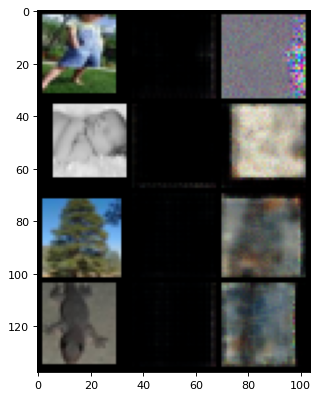

Testing on CIFAR100 test set
Testing decoder - Epoch 0 d_loss = 0.6316144466400146


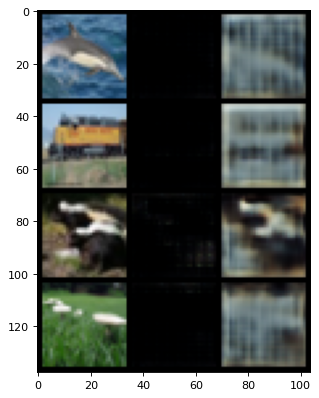

Testing on CIFAR10 train set
Testing decoder - Epoch 0 d_loss = 0.558452308177948


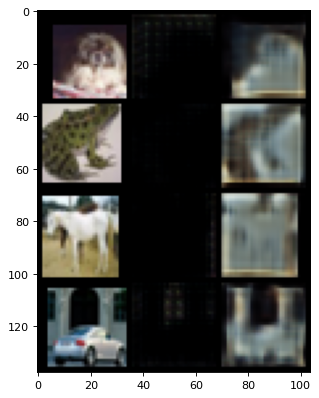

Testing on CIFAR10 test set
Testing decoder - Epoch 0 d_loss = 0.6357549428939819


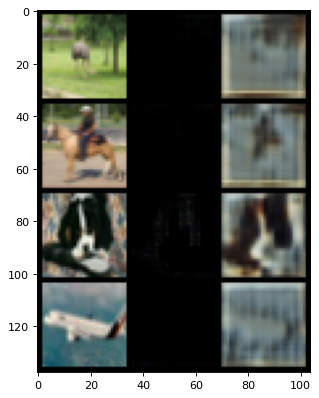

Training decoder - Epoch 1 d_loss = 0.5017532110214233
Testing on CIFAR100 test set
Testing decoder - Epoch 1 d_loss = 0.729738712310791
Testing on CIFAR10 train set
Testing decoder - Epoch 1 d_loss = 0.6480345726013184
Testing on CIFAR10 test set
Testing decoder - Epoch 1 d_loss = 0.7488473653793335
Training decoder - Epoch 2 d_loss = 0.4963688850402832
Testing on CIFAR100 test set
Testing decoder - Epoch 2 d_loss = 0.7883265614509583
Testing on CIFAR10 train set
Testing decoder - Epoch 2 d_loss = 0.6750744581222534
Testing on CIFAR10 test set
Testing decoder - Epoch 2 d_loss = 0.7863988876342773
Training decoder - Epoch 3 d_loss = 0.4937145709991455
Testing on CIFAR100 test set
Testing decoder - Epoch 3 d_loss = 0.7320480942726135
Testing on CIFAR10 train set
Testing decoder - Epoch 3 d_loss = 0.6490169167518616
Testing on CIFAR10 test set
Testing decoder - Epoch 3 d_loss = 0.7486834526062012
Training decoder - Epoch 4 d_loss = 0.49183228611946106
Testing on CIFAR100 test set
Testing

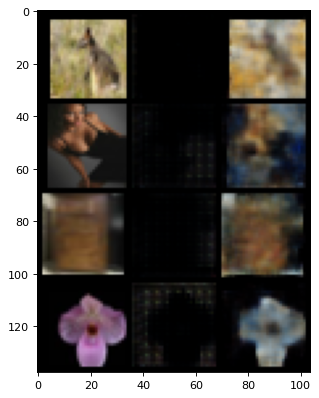

Testing on CIFAR100 test set
Testing decoder - Epoch 5 d_loss = 0.6232173442840576


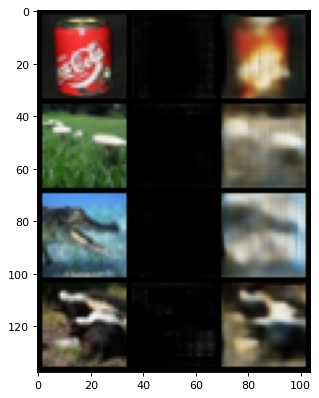

Testing on CIFAR10 train set
Testing decoder - Epoch 5 d_loss = 0.5473028421401978


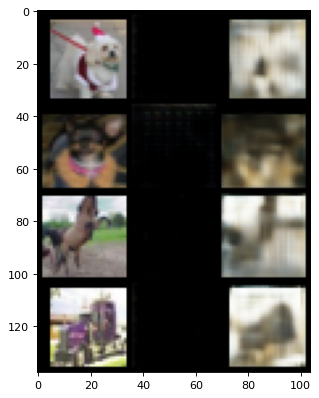

Testing on CIFAR10 test set
Testing decoder - Epoch 5 d_loss = 0.6354942917823792


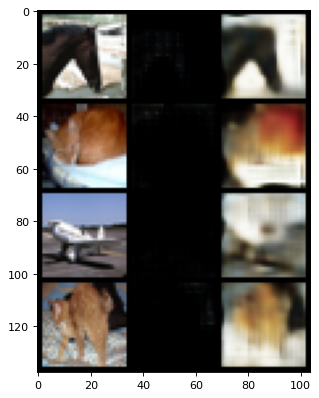

Training decoder - Epoch 6 d_loss = 0.48966798186302185
Testing on CIFAR100 test set
Testing decoder - Epoch 6 d_loss = 0.6871442794799805
Testing on CIFAR10 train set
Testing decoder - Epoch 6 d_loss = 0.614575207233429
Testing on CIFAR10 test set
Testing decoder - Epoch 6 d_loss = 0.6892150640487671
Training decoder - Epoch 7 d_loss = 0.489162802696228
Testing on CIFAR100 test set
Testing decoder - Epoch 7 d_loss = 0.6976154446601868
Testing on CIFAR10 train set
Testing decoder - Epoch 7 d_loss = 0.6395058631896973
Testing on CIFAR10 test set
Testing decoder - Epoch 7 d_loss = 0.7144792079925537
Training decoder - Epoch 8 d_loss = 0.4885985553264618
Testing on CIFAR100 test set
Testing decoder - Epoch 8 d_loss = 1.5671330690383911
Testing on CIFAR10 train set
Testing decoder - Epoch 8 d_loss = 1.2450172901153564
Testing on CIFAR10 test set
Testing decoder - Epoch 8 d_loss = 1.5118061304092407
Training decoder - Epoch 9 d_loss = 0.48816773295402527
Testing on CIFAR100 test set
Testing

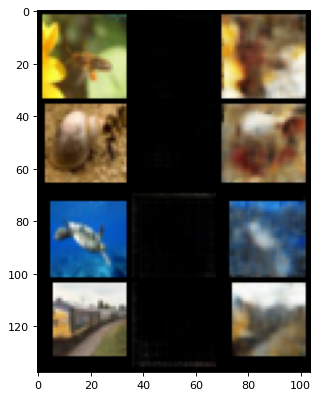

Testing on CIFAR100 test set
Testing decoder - Epoch 10 d_loss = 0.8864272236824036


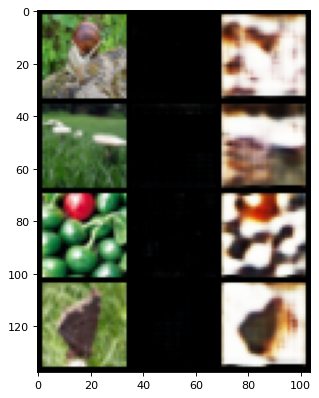

Testing on CIFAR10 train set
Testing decoder - Epoch 10 d_loss = 0.7911775708198547


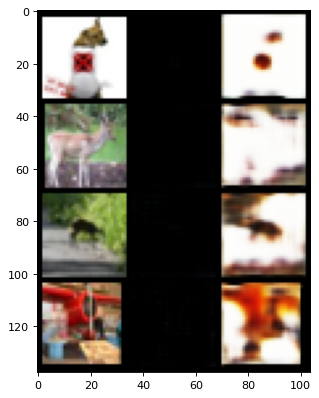

Testing on CIFAR10 test set
Testing decoder - Epoch 10 d_loss = 0.9138767123222351


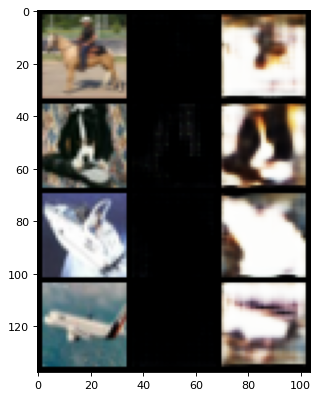

Training decoder - Epoch 11 d_loss = 0.48745936155319214
Testing on CIFAR100 test set
Testing decoder - Epoch 11 d_loss = 0.8180795907974243
Testing on CIFAR10 train set
Testing decoder - Epoch 11 d_loss = 0.6863455176353455
Testing on CIFAR10 test set
Testing decoder - Epoch 11 d_loss = 0.8276525139808655
Training decoder - Epoch 12 d_loss = 0.48753440380096436
Testing on CIFAR100 test set
Testing decoder - Epoch 12 d_loss = 0.7059961557388306
Testing on CIFAR10 train set
Testing decoder - Epoch 12 d_loss = 0.5917984843254089
Testing on CIFAR10 test set
Testing decoder - Epoch 12 d_loss = 0.6961642503738403
Training decoder - Epoch 13 d_loss = 0.48710936307907104
Testing on CIFAR100 test set
Testing decoder - Epoch 13 d_loss = 0.6219631433486938
Testing on CIFAR10 train set
Testing decoder - Epoch 13 d_loss = 0.5582102537155151
Testing on CIFAR10 test set
Testing decoder - Epoch 13 d_loss = 0.6375342607498169
Training decoder - Epoch 14 d_loss = 0.4870140552520752
Testing on CIFAR100 

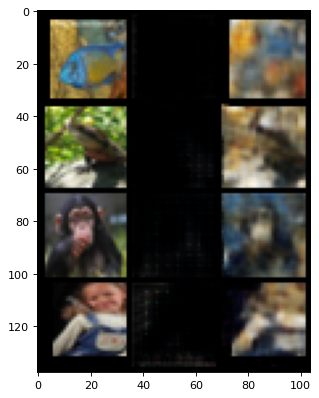

Testing on CIFAR100 test set
Testing decoder - Epoch 15 d_loss = 0.640953779220581


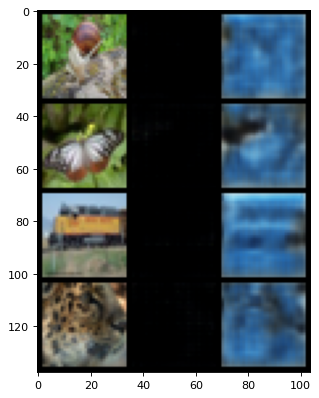

Testing on CIFAR10 train set
Testing decoder - Epoch 15 d_loss = 0.5786840319633484


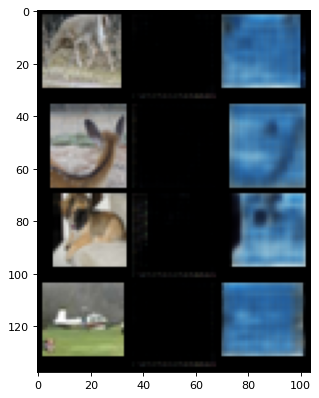

Testing on CIFAR10 test set
Testing decoder - Epoch 15 d_loss = 0.6537272334098816


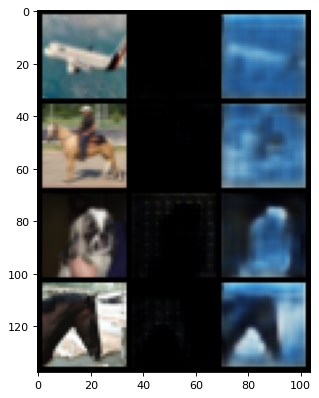

Training decoder - Epoch 16 d_loss = 0.4875957667827606
Testing on CIFAR100 test set
Testing decoder - Epoch 16 d_loss = 1.0080430507659912
Testing on CIFAR10 train set
Testing decoder - Epoch 16 d_loss = 0.8591467142105103
Testing on CIFAR10 test set
Testing decoder - Epoch 16 d_loss = 1.0346122980117798
Training decoder - Epoch 17 d_loss = 0.48724523186683655
Testing on CIFAR100 test set
Testing decoder - Epoch 17 d_loss = 0.7241208553314209
Testing on CIFAR10 train set
Testing decoder - Epoch 17 d_loss = 0.6281768083572388
Testing on CIFAR10 test set
Testing decoder - Epoch 17 d_loss = 0.7249972224235535
Training decoder - Epoch 18 d_loss = 0.4862104058265686
Testing on CIFAR100 test set
Testing decoder - Epoch 18 d_loss = 0.8034979701042175
Testing on CIFAR10 train set
Testing decoder - Epoch 18 d_loss = 0.6869035959243774
Testing on CIFAR10 test set
Testing decoder - Epoch 18 d_loss = 0.815873384475708
Training decoder - Epoch 19 d_loss = 0.48620760440826416
Testing on CIFAR100 te

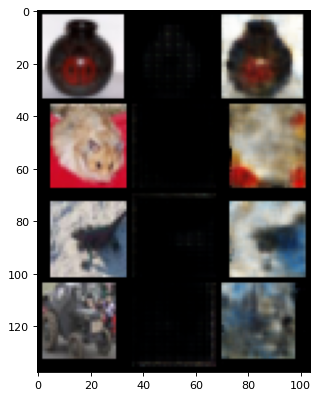

Testing on CIFAR100 test set
Testing decoder - Epoch 20 d_loss = 0.6288354396820068


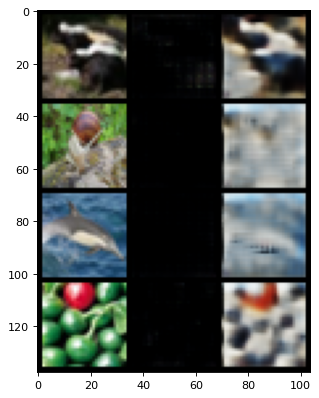

Testing on CIFAR10 train set
Testing decoder - Epoch 20 d_loss = 0.5702584385871887


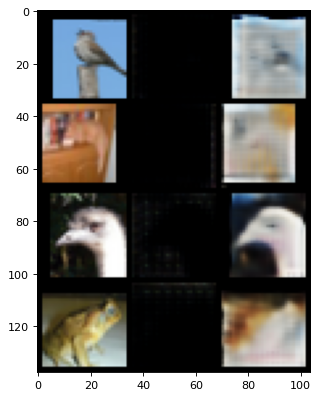

Testing on CIFAR10 test set
Testing decoder - Epoch 20 d_loss = 0.6443321704864502


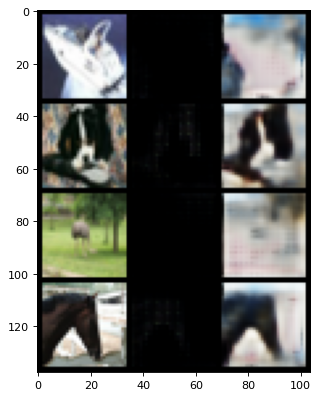

In [37]:
# Training decoder first
scale = 10.
for epoch in range(21):
    show = False
    if epoch % 5 == 0:
        show = True
    # Training in domain
    train_decoder(cifar100_train_loader, epoch, generator, decoder, mse_criterion, show=show, scale = scale)
    # Testing in domain
    print('Testing on CIFAR100 test set')
    test_decoder(cifar100_test_loader, generator, decoder, mse_criterion, show=show, scale = scale)
    # Testing in out of domain dataset
    print('Testing on CIFAR10 train set')
    test_decoder(cifar10_train_loader, generator, decoder, mse_criterion, show=show, scale = scale)
    print('Testing on CIFAR10 test set')
    test_decoder(cifar10_test_loader, generator, decoder, mse_criterion, show=show, scale = scale)